In [3]:
import sys
sys.path.insert(0, '..\\')

from df2block import *
import pandas as pd
from pyomo.environ import *
import plotly.express as px
import plotly.subplots as sp
from sklearn.neural_network import MLPRegressor
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

In [4]:
from pickle import dump, load

## Reading the data

Suppose you have three production lines: A, B and C. These lines produce product **y** from the components **x0** and **x1**. 

The production level depends on the temperature in -10&deg;C to +10&deg;C range.

### Line A

You don't have on-line measurements from this line. But you have results of the tests, conducted at -10&deg;C, 0&deg;C and +10&deg;C

In [5]:
dataA = pd.read_csv('..\Data\dataA.csv')
px.scatter_3d(data_frame=dataA, x='x0', y='x1', z='y', color='t')

### Line B

This line is equiped with the SCADA system and you collected 10000 samples of data

In [6]:
dataB = pd.read_csv('..\Data\dataB.csv')
px.scatter_3d(data_frame=dataB, x='x0', y='x1', z='y', color='t')

### Line C

This line is also equiped with the SCADA system, but the collected data demonstrates linear dependance of product output from the amounts of components.

In [7]:
dataC = pd.read_csv('..\Data\dataC.csv')
px.scatter_3d(data_frame=dataC, x='x0', y='x1', z='y', color='t')

## Optimization problem

You are planning production schedule for the next day to maximize your marginal profit:

$Profit = \sum_h{\left({y_h*sale_price_h - \sum_{i=0,1}x_{ih}*comp_price_{ih}}\right)}$

You know forecast for the product and components prices and the temperature for 24 hours

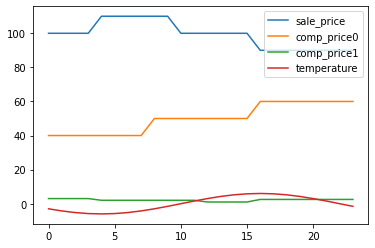

In [8]:
forecast = pd.read_csv('..\\Data\\forecast.csv')
forecast.plot();

## PyOMO optimization model

Let's create Concrete model for this problem

In [9]:
m1_2h = ConcreteModel()

m1_2h.t = range(2)

## Blocks construction

For the line A you may construct piecewise linear representation using PWL_Block function

In [10]:
m1_2h.LineA = PWL_Block(m1_2h.t, dataA)

Now let's test this block

In [11]:
def testA_rule(m,t):
    return 6*m.LineA.Vars[t,'x0'] + m.LineA.Vars[t,'x1'] <= 400
m1_2h.testA_constraint = Constraint(m1_2h.t, rule=testA_rule)
    
m1_2h.LineA.max = Objective(expr= sum(m1_2h.LineA.Vars[t,'y'] for t in m1_2h.t), sense=maximize)

In [12]:
from pyomo.opt import SolverFactory

In [13]:
opt = SolverFactory('scip')

In [14]:
status = opt.solve(m1_2h, tee=True)

SCIP version 6.0.0 [precision: 8 byte] [memory: block] [mode: optimized] [LP solver: SoPlex 4.0.0] [GitHash: 77d3bc8]
Copyright (C) 2002-2018 Konrad-Zuse-Zentrum fuer Informationstechnik Berlin (ZIB)

External codes: 
  SoPlex 4.0.0         Linear Programming Solver developed at Zuse Institute Berlin (soplex.zib.de) [GitHash: 82cab95]
  CppAD 20180000.0     Algorithmic Differentiation of C++ algorithms developed by B. Bell (www.coin-or.org/CppAD)
  Ipopt 3.12.12        Interior Point Optimizer developed by A. Waechter et.al. (www.coin-or.org/Ipopt)
  ASL                  AMPL Solver Library developed by D. Gay (www.netlib.com/ampl)


number of parameters = 2428
non-default parameter settings:


read problem <C:\Users\User\AppData\Local\Temp\tmp96_fjxsd.pyomo.nl>

original problem has 2043 variables (1615 bin, 0 int, 0 impl, 428 cont) and 434 constraints

1/1 feasible solution given by solution candidate storage, new primal bound 0.000000e+00

presolving:
(round 1, fast)       6 del var

  2.1s|     1 |     0 |   897 |     - |  51M|   0 |   8 |2035 | 422 |2035 | 445 |  33 |  16 |  43 | 1.084890e+02 | 1.075789e+02 |   0.85%
  2.1s|     1 |     0 |   913 |     - |  51M|   0 |   6 |2035 | 422 |2035 | 448 |  36 |  16 |  43 | 1.084654e+02 | 1.075789e+02 |   0.82%
  2.1s|     1 |     0 |   919 |     - |  51M|   0 |  11 |2035 | 422 |2035 | 449 |  37 |  16 |  43 | 1.084647e+02 | 1.075789e+02 |   0.82%
  2.2s|     1 |     0 |   923 |     - |  51M|   0 |   - |2035 | 423 |2035 | 449 |  37 |  19 |  47 | 1.084645e+02 | 1.075789e+02 |   0.82%
(run 1, node 1) restarting after 767 global fixings of integer variables

(restart) converted 23 cuts from the global cut pool into linear constraints

presolving:
(round 1, fast)       926 del vars, 156 del conss, 0 add conss, 153 chg bounds, 0 chg sides, 2260 chg coeffs, 0 upgd conss, 206214 impls, 2 clqs
(round 2, exhaustive) 926 del vars, 157 del conss, 0 add conss, 153 chg bounds, 0 chg sides, 2260 chg coeffs, 0 upgd conss, 206214 impls, 2

In [15]:
m1_2h.LineA.Vars.display()

Vars : Size=8, Index=LineA.Vars_index
    Key       : Lower : Value               : Upper : Fixed : Stale : Domain
     (0, 't') :  None :               -10.0 :  None : False : False :  Reals
    (0, 'x0') :  None :   34.99999999999999 :  None : False : False :  Reals
    (0, 'x1') :  None :  190.00000000000003 :  None : False : False :  Reals
     (0, 'y') :  None :   54.19800418996641 :  None : False : False :  Reals
     (1, 't') :  None : -10.000000000000004 :  None : False : False :  Reals
    (1, 'x0') :  None :                35.0 :  None : False : False :  Reals
    (1, 'x1') :  None :  189.99999999999997 :  None : False : False :  Reals
     (1, 'y') :  None :  54.198004189966404 :  None : False : False :  Reals


In [14]:
35*6+190

400

In [15]:
from scipy.interpolate import LinearNDInterpolator

fA = LinearNDInterpolator(dataA[['x0','x1','t']],dataA.y)
fA(35,190,-10)

array(54.19800419)

In [20]:
m1_24h = ConcreteModel()

m1_24h.t = range(24)

m1_24h.LineA = PWL_Block(m1_24h.t, dataA, ext={'t': 5})

def testA_rule(m,t):
    return 6*m.LineA.Vars[t,'x0'] + m.LineA.Vars[t,'x1'] <= 400
m1_24h.testA_constraint = Constraint(m1_24h.t, rule=testA_rule)

m1_24h.LineA.max = Objective(expr= sum(m1_24h.LineA.Vars[t,'y'] for t in m1_24h.t), sense=maximize)

In [21]:
opt = SolverFactory('scip')

In [22]:
status = opt.solve(m1_24h, tee=True)

SCIP version 6.0.0 [precision: 8 byte] [memory: block] [mode: optimized] [LP solver: SoPlex 4.0.0] [GitHash: 77d3bc8]
Copyright (C) 2002-2018 Konrad-Zuse-Zentrum fuer Informationstechnik Berlin (ZIB)

External codes: 
  SoPlex 4.0.0         Linear Programming Solver developed at Zuse Institute Berlin (soplex.zib.de) [GitHash: 82cab95]
  CppAD 20180000.0     Algorithmic Differentiation of C++ algorithms developed by B. Bell (www.coin-or.org/CppAD)
  Ipopt 3.12.12        Interior Point Optimizer developed by A. Waechter et.al. (www.coin-or.org/Ipopt)
  ASL                  AMPL Solver Library developed by D. Gay (www.netlib.com/ampl)


number of parameters = 2428
non-default parameter settings:


read problem <C:\Users\User\AppData\Local\Temp\tmpboxxp5ed.pyomo.nl>

original problem has 24505 variables (19369 bin, 0 int, 0 impl, 5136 cont) and 5208 constraints

1/1 feasible solution given by solution candidate storage, new primal bound 0.000000e+00

presolving:
(round 1, fast)       72 de

 35.8s|     1 |     0 |  3731 |     - | 218M|   0 | 206 |  24k|5112 |  24k|5668 | 733 |   0 |   0 | 1.313977e+03 | 1.222389e+03 |   7.49%
 37.5s|     1 |     0 |  3870 |     - | 218M|   0 | 214 |  24k|5112 |  24k|5620 | 754 |   0 |   0 | 1.313779e+03 | 1.222389e+03 |   7.48%
 39.2s|     1 |     0 |  3978 |     - | 218M|   0 | 207 |  24k|5112 |  24k|5642 | 776 |   0 |   0 | 1.313627e+03 | 1.222389e+03 |   7.46%
 40.8s|     1 |     0 |  4106 |     - | 220M|   0 | 214 |  24k|5112 |  24k|5660 | 794 |   0 |   0 | 1.313437e+03 | 1.222389e+03 |   7.45%
 time | node  | left  |LP iter|LP it/n| mem |mdpt |frac |vars |cons |cols |rows |cuts |confs|strbr|  dualbound   | primalbound  |  gap   
 42.4s|     1 |     0 |  4250 |     - | 220M|   0 | 215 |  24k|5112 |  24k|5682 | 816 |   0 |   0 | 1.313319e+03 | 1.222389e+03 |   7.44%
 44.1s|     1 |     0 |  4365 |     - | 220M|   0 | 219 |  24k|5112 |  24k|5704 | 838 |   0 |   0 | 1.313213e+03 | 1.222389e+03 |   7.43%
 45.9s|     1 |     0 |  4494 |   

 88.3s|     1 |     0 | 16495 |     - | 259M|   0 | 232 |  24k|5134 |  24k|5754 |1607 |  42 |  39 | 1.308331e+03 | 1.271957e+03 |   2.86%
 88.4s|     1 |     0 | 16653 |     - | 259M|   0 | 241 |  24k|5133 |  24k|5743 |1630 |  43 |  39 | 1.308179e+03 | 1.271957e+03 |   2.85%
 88.6s|     1 |     0 | 16748 |     - | 259M|   0 | 235 |  24k|5131 |  24k|5743 |1630 |  46 |  43 | 1.308009e+03 | 1.271957e+03 |   2.83%
 90.5s|     1 |     0 | 16945 |     - | 261M|   0 | 239 |  24k|5131 |  24k|5769 |1656 |  46 |  43 | 1.307816e+03 | 1.271957e+03 |   2.82%
 90.6s|     1 |     0 | 17101 |     - | 262M|   0 | 234 |  24k|5131 |  24k|5754 |1674 |  47 |  43 | 1.307728e+03 | 1.271957e+03 |   2.81%
 90.9s|     1 |     0 | 17137 |     - | 262M|   0 | 230 |  24k|5136 |  24k|5754 |1674 |  52 |  49 | 1.307718e+03 | 1.271957e+03 |   2.81%
 92.9s|     1 |     0 | 17287 |     - | 264M|   0 | 229 |  24k|5136 |  24k|5778 |1698 |  52 |  49 | 1.307558e+03 | 1.271957e+03 |   2.80%
 93.0s|     1 |     0 | 17405 |   

  129s|     1 |     0 | 22254 |     - | 278M|   0 | 196 |  24k|5158 |  24k|5757 |2252 | 120 | 162 | 1.302064e+03 | 1.271957e+03 |   2.37%
  131s|     1 |     0 | 22350 |     - | 279M|   0 | 192 |  24k|5158 |  24k|5768 |2263 | 120 | 162 | 1.301985e+03 | 1.271957e+03 |   2.36%
  131s|     1 |     0 | 22430 |     - | 280M|   0 | 181 |  24k|5158 |  24k|5778 |2273 | 120 | 162 | 1.301925e+03 | 1.271957e+03 |   2.36%
  131s|     1 |     0 | 22477 |     - | 280M|   0 | 171 |  24k|5159 |  24k|5778 |2273 | 125 | 176 | 1.301880e+03 | 1.271957e+03 |   2.35%
  133s|     1 |     0 | 22540 |     - | 280M|   0 | 181 |  24k|5159 |  24k|5788 |2283 | 126 | 176 | 1.301865e+03 | 1.271957e+03 |   2.35%
  133s|     1 |     0 | 22599 |     - | 280M|   0 | 183 |  24k|5159 |  24k|5794 |2289 | 126 | 176 | 1.301831e+03 | 1.271957e+03 |   2.35%
  133s|     1 |     0 | 22614 |     - | 280M|   0 | 181 |  24k|5160 |  24k|5794 |2289 | 130 | 180 | 1.301820e+03 | 1.271957e+03 |   2.35%
  135s|     1 |     0 | 22696 |   

  159s|     1 |     0 | 24927 |     - | 285M|   0 |  49 |  24k|5157 |  24k|5586 |2552 | 182 | 343 | 1.300859e+03 | 1.271957e+03 |   2.27%
  159s|     1 |     0 | 24944 |     - | 285M|   0 |  49 |  24k|5156 |  24k|5588 |2554 | 182 | 343 | 1.300858e+03 | 1.271957e+03 |   2.27%
  159s|     1 |     0 | 24953 |     - | 285M|   0 |  49 |  24k|5155 |  24k|5588 |2554 | 183 | 345 | 1.300858e+03 | 1.271957e+03 |   2.27%
  159s|     1 |     0 | 24957 |     - | 285M|   0 |  49 |  24k|5155 |  24k|5590 |2556 | 183 | 345 | 1.300858e+03 | 1.271957e+03 |   2.27%
  159s|     1 |     0 | 24966 |     - | 285M|   0 |  49 |  24k|5155 |  24k|5566 |2557 | 183 | 345 | 1.300857e+03 | 1.271957e+03 |   2.27%
  159s|     1 |     0 | 24966 |     - | 285M|   0 |  47 |  24k|5154 |  24k|5566 |2557 | 184 | 347 | 1.300857e+03 | 1.271957e+03 |   2.27%
  159s|     1 |     0 | 24976 |     - | 285M|   0 |  47 |  24k|5154 |  24k|5567 |2558 | 184 | 347 | 1.300857e+03 | 1.271957e+03 |   2.27%
  159s|     1 |     0 | 24979 |   

In [23]:
m1_24h.LineA.Vars.display()

Vars : Size=96, Index=LineA.Vars_index
    Key        : Lower : Value               : Upper : Fixed : Stale : Domain
      (0, 't') :  None : -10.000000000000002 :  None : False : False :  Reals
     (0, 'x0') :  None :   34.99999999999997 :  None : False : False :  Reals
     (0, 'x1') :  None :  190.00000000000014 :  None : False : False :  Reals
      (0, 'y') :  None :  54.198004189966404 :  None : False : False :  Reals
      (1, 't') :  None : -10.000000000000039 :  None : False : False :  Reals
     (1, 'x0') :  None :   35.00000000000017 :  None : False : False :  Reals
     (1, 'x1') :  None :  189.99999999999892 :  None : False : False :  Reals
      (1, 'y') :  None :    54.1980041899664 :  None : False : False :  Reals
      (2, 't') :  None : -10.000000000000002 :  None : False : False :  Reals
     (2, 'x0') :  None :   35.00000000000003 :  None : False : False :  Reals
     (2, 'x1') :  None :  189.99999999999986 :  None : False : False :  Reals
      (2, 'y') :  None : 

#### Блок с модификацией PWL при фиксации некоторых переменных

При разных значаниях параметров в словаре для разных часов формировались разные связи в блоке

In [28]:
m1_24h = ConcreteModel()

m1_24h.t = range(24)

m1_24h.LineA = PWL_Block(m1_24h.t, dataA, ext={'t': 5})

def testA_rule(m,t):
    return 6*m.LineA.Vars[t,'x0'] + m.LineA.Vars[t,'x1'] <= 400
m1_24h.testA_constraint = Constraint(m1_24h.t, rule=testA_rule)

m1_24h.LineA.max = Objective(expr= sum(m1_24h.LineA.Vars[t,'y'] for t in m1_24h.t), sense=maximize)

In [29]:
status = opt.solve(m1_24h, tee=True)

SCIP version 6.0.0 [precision: 8 byte] [memory: block] [mode: optimized] [LP solver: SoPlex 4.0.0] [GitHash: 77d3bc8]
Copyright (C) 2002-2018 Konrad-Zuse-Zentrum fuer Informationstechnik Berlin (ZIB)

External codes: 
  SoPlex 4.0.0         Linear Programming Solver developed at Zuse Institute Berlin (soplex.zib.de) [GitHash: 82cab95]
  CppAD 20180000.0     Algorithmic Differentiation of C++ algorithms developed by B. Bell (www.coin-or.org/CppAD)
  Ipopt 3.12.12        Interior Point Optimizer developed by A. Waechter et.al. (www.coin-or.org/Ipopt)
  ASL                  AMPL Solver Library developed by D. Gay (www.netlib.com/ampl)


number of parameters = 2428
non-default parameter settings:


read problem <C:\Users\User\AppData\Local\Temp\tmp8j9_i81k.pyomo.nl>

original problem has 4345 variables (2593 bin, 0 int, 0 impl, 1752 cont) and 1824 constraints

1/1 feasible solution given by solution candidate storage, new primal bound 0.000000e+00

presolving:
(round 1, fast)       72 del 

 14.4s|     1 |     0 |  3367 |     - |  67M|   0 | 181 |4273 |1752 |4273 |2338 | 883 |   0 |   0 | 1.137644e+03 | 1.014696e+03 |  12.12%
 15.0s|     1 |     0 |  3462 |     - |  67M|   0 | 185 |4273 |1752 |4273 |2363 | 908 |   0 |   0 | 1.137347e+03 | 1.014696e+03 |  12.09%
 15.7s|     1 |     0 |  3576 |     - |  68M|   0 | 184 |4273 |1752 |4273 |2277 | 932 |   0 |   0 | 1.137052e+03 | 1.014696e+03 |  12.06%
 16.3s|     1 |     0 |  3655 |     - |  69M|   0 | 184 |4273 |1752 |4273 |2296 | 951 |   0 |   0 | 1.136829e+03 | 1.014696e+03 |  12.04%
 time | node  | left  |LP iter|LP it/n| mem |mdpt |frac |vars |cons |cols |rows |cuts |confs|strbr|  dualbound   | primalbound  |  gap   
 16.8s|     1 |     0 |  3746 |     - |  69M|   0 | 190 |4273 |1752 |4273 |2319 | 974 |   0 |   0 | 1.136593e+03 | 1.014696e+03 |  12.01%
 17.4s|     1 |     0 |  3863 |     - |  71M|   0 | 191 |4273 |1752 |4273 |2343 | 998 |   0 |   0 | 1.136374e+03 | 1.014696e+03 |  11.99%
 18.1s|     1 |     0 |  3930 |   

 51.8s|     1 |     0 |  8893 |     - |  87M|   0 | 235 |4273 |1752 |4273 |2327 |1904 |   0 |   0 | 1.127905e+03 | 1.014696e+03 |  11.16%
 52.6s|     1 |     0 |  8995 |     - |  87M|   0 | 232 |4273 |1752 |4273 |2342 |1919 |   0 |   0 | 1.127806e+03 | 1.014696e+03 |  11.15%
 53.3s|     1 |     0 |  9131 |     - |  87M|   0 | 226 |4273 |1752 |4273 |2358 |1935 |   0 |   0 | 1.127636e+03 | 1.014696e+03 |  11.13%
 54.0s|     1 |     0 |  9226 |     - |  87M|   0 | 222 |4273 |1752 |4273 |2370 |1947 |   0 |   0 | 1.127453e+03 | 1.014696e+03 |  11.11%
 54.7s|     1 |     0 |  9329 |     - |  88M|   0 | 237 |4273 |1752 |4273 |2384 |1961 |   0 |   0 | 1.127308e+03 | 1.014696e+03 |  11.10%
 55.5s|     1 |     0 |  9443 |     - |  88M|   0 | 244 |4273 |1752 |4273 |2398 |1975 |   0 |   0 | 1.127182e+03 | 1.014696e+03 |  11.09%
 56.3s|     1 |     0 |  9567 |     - |  88M|   0 | 238 |4273 |1752 |4273 |2338 |1990 |   0 |   0 | 1.127041e+03 | 1.014696e+03 |  11.07%
 57.0s|     1 |     0 |  9659 |   

 86.5s|     1 |     0 | 17708 |     - |  94M|   0 | 189 |4273 |1768 |4273 |2446 |2699 |  28 |  52 | 1.121894e+03 | 1.113849e+03 |   0.72%
 86.5s|     1 |     0 | 17729 |     - |  94M|   0 | 188 |4273 |1768 |4273 |2451 |2704 |  28 |  52 | 1.121887e+03 | 1.113849e+03 |   0.72%
 86.6s|     1 |     0 | 17812 |     - |  94M|   0 | 173 |4273 |1772 |4273 |2451 |2704 |  34 |  56 | 1.121746e+03 | 1.113849e+03 |   0.71%
 87.2s|     1 |     0 | 17884 |     - |  94M|   0 | 177 |4273 |1772 |4273 |2461 |2714 |  34 |  56 | 1.121678e+03 | 1.113849e+03 |   0.70%
 87.2s|     1 |     0 | 17953 |     - |  94M|   0 | 176 |4273 |1772 |4273 |2467 |2720 |  34 |  56 | 1.121654e+03 | 1.113849e+03 |   0.70%
 87.3s|     1 |     0 | 18014 |     - |  94M|   0 | 162 |4273 |1775 |4273 |2467 |2720 |  39 |  65 | 1.121570e+03 | 1.113849e+03 |   0.69%
 87.9s|     1 |     0 | 18088 |     - |  94M|   0 | 168 |4273 |1775 |4273 |2480 |2733 |  39 |  65 | 1.121570e+03 | 1.113849e+03 |   0.69%
 87.9s|     1 |     0 | 18119 |   


optimal solution found



### Line B - Neural Network approximation

In [30]:
sc = StandardScaler()
sc_dataB = sc.fit_transform(dataB)
#nn = MLPRegressor(8, verbose=True,
#                  learning_rate_init=0.0001,
#                  learning_rate='adaptive', 
#                  alpha=0.1, tol=1e-12, 
#                  max_iter=30000, max_fun=1e-8,
#                  n_iter_no_change= 100)

In [34]:
#nn.fit(sc_dataB[:,:-1], sc_dataB[:,-1])
import joblib
nn = joblib.load('..\Data\joblib_model.pkl')

In [35]:
sc_dataB[:,-1] = nn.predict(sc_dataB[:,:-1])

In [36]:
new_dataB = pd.DataFrame(sc.inverse_transform(sc_dataB), columns=dataB.columns)

In [37]:
dataB.y-new_dataB.y

0      -1.015533
1      -0.652245
2       0.041977
3       0.053603
4       0.805485
          ...   
9995    1.369119
9996   -0.461137
9997    0.359087
9998    0.055285
9999   -0.224375
Name: y, Length: 10000, dtype: float64

Text(0.5, 1.0, '0.4267234894338274')

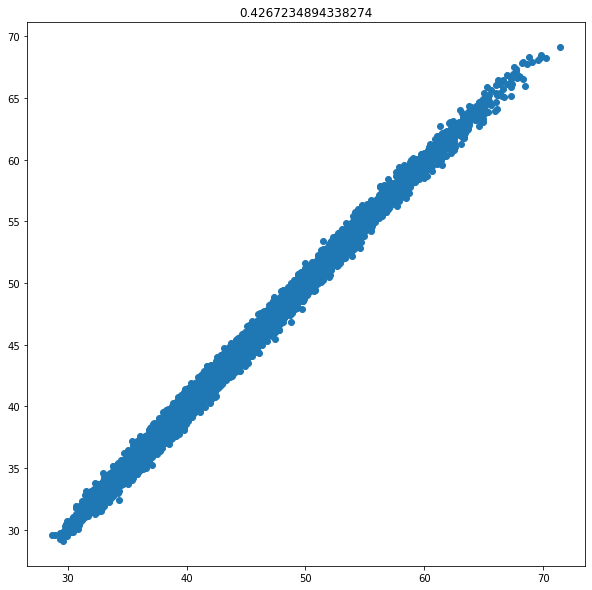

In [38]:
plt.figure(figsize=(10,10))
plt.scatter(dataB.y, new_dataB.y)
plt.title(str((dataB.y-new_dataB.y).abs().mean()))

In [39]:
px.scatter_3d(data_frame=new_dataB, x='x0', y='x1', z='y', color='t')

In [35]:
#fnn = open('LineB.nn', 'wb')
#dump(nn, fnn)

In [40]:
tmpB = dataB.copy()

tmpB.t = 5

sample = sc.transform(tmpB)
sample[:,-1] = nn.predict(sample[:,:-1])
tmpB = pd.DataFrame(sc.inverse_transform(sample), columns=tmpB.columns)

px.scatter_3d(data_frame=tmpB, x='x0', y='x1', z='y', color='t')

In [41]:
#fname = open('LineB.nn', 'rb')
nn1 = joblib.load('..\Data\joblib_model.pkl')
sc=StandardScaler().fit(dataB)

nn1.intercepts_[0] += 5*nn1.coefs_[0][2,:]
nn1.coefs_[0] = np.delete(nn1.coefs_[0], [2], axis=0)

areas = (sample[:,:2]@nn1.coefs_[0]+nn1.intercepts_[0])>0

adf = pd.DataFrame(areas)
adf['comb'] = adf.agg(tuple, axis=1)
adf['area'] = adf['comb'].factorize()[0]

px.scatter_3d(data_frame=tmpB.join(adf.area), x='x0', y='x1', z='y', color='area')

#### Блок с модификацией нейросети при фиксации некоторых переменных

При разных значаниях параметров в словаре для разных часов формировались разные связи в блоке

Здесь версия, в которой используются функции Piecewise для активации нейронов

Сейчас glpk не может работать с NN_Block, потому что там SOS2 используются, а оно не поддерживается glpk


In [53]:
#fname = open('LineB.nn', 'rb')
#nn = load(fname)
nn = joblib.load('..\\Data\\joblib_model.pkl')
sc=StandardScaler().fit(dataB)

In [54]:
opt = SolverFactory('scip')

In [57]:
#fname = open('LineB.nn', 'rb')
#nn = load(fname)
nn = joblib.load('..\Data\joblib_model.pkl')
sc=StandardScaler().fit(dataB)
tmp = dataB.copy()

m2_24h = ConcreteModel()

m2_24h.t = range(2)

m2_24h.LineB = NN_Block(m2_24h.t, tmp, nn, sc, pinned={'t': [5,6]})

def testB_rule(m,t):
    return 6*m.LineB.Vars[t,'x0'] + m.LineB.Vars[t,'x1'] <= 400
m2_24h.testB_constraint = Constraint(m2_24h.t, rule=testB_rule)

m2_24h.LineB.max = Objective(expr= sum(m2_24h.LineB.Vars[t,'y'] for t in m2_24h.t), sense=maximize)

In [58]:
dataBstatus = opt.solve(m2_24h, tee=True)

SCIP version 6.0.0 [precision: 8 byte] [memory: block] [mode: optimized] [LP solver: SoPlex 4.0.0] [GitHash: 77d3bc8]
Copyright (C) 2002-2018 Konrad-Zuse-Zentrum fuer Informationstechnik Berlin (ZIB)

External codes: 
  SoPlex 4.0.0         Linear Programming Solver developed at Zuse Institute Berlin (soplex.zib.de) [GitHash: 82cab95]
  CppAD 20180000.0     Algorithmic Differentiation of C++ algorithms developed by B. Bell (www.coin-or.org/CppAD)
  Ipopt 3.12.12        Interior Point Optimizer developed by A. Waechter et.al. (www.coin-or.org/Ipopt)
  ASL                  AMPL Solver Library developed by D. Gay (www.netlib.com/ampl)


number of parameters = 2428
non-default parameter settings:


read problem <C:\Users\User\AppData\Local\Temp\tmp9eaofrmo.pyomo.nl>

original problem has 57 variables (17 bin, 0 int, 0 impl, 40 cont) and 582 constraints

1/1 feasible solution given by solution candidate storage, new primal bound 0.000000e+00

presolving:
(round 1, fast)       10 del vars, 2

In [59]:
m2_24h.LineB.Vars.pprint()

Vars : Size=8, Index=LineB.Vars_index
    Key       : Lower : Value              : Upper : Fixed : Stale : Domain
     (0, 't') :  None :                5.0 :  None : False : False :  Reals
    (0, 'x0') :  None : 34.973971004826694 :  None : False : False :  Reals
    (0, 'x1') :  None : 190.15617397103983 :  None : False : False :  Reals
     (0, 'y') :  None : 56.549246508052946 :  None : False : False :  Reals
     (1, 't') :  None :                6.0 :  None : False : False :  Reals
    (1, 'x0') :  None : 34.969621238977666 :  None : False : False :  Reals
    (1, 'x1') :  None :   190.182272566134 :  None : False : False :  Reals
     (1, 'y') :  None : 56.040815907696405 :  None : False : False :  Reals
